# OFFLINE PATH PLANNING OPTIMISATION
This notebook elaborates the **testing** of the Constrained Quadratic Path Curvature Optimisation pipeline to generate a safe and feasible reference path for a ego vehicle. The pipeline takes a set of coarsely placed waypoints and adjusts their localisation so as to comply with certain **path curvature** constraints in view of the vehicle's size and steering capability. The adjusted waypoints should be as close as possible to the original waypoints without violating the curvature constraints.

## Setup

### Installation
Before beginning, it is important to install all the dependencies to run all cells in this notebook. You can do that by running the following cell after converting the Markdown into code.

!pip install -r requirements.txt

### Imports

In [37]:
import time as t
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

from scipy.optimize import minimize

### Importing Waypoints

In [38]:
dir_path = 'ngeeann.csv'
df = pd.read_csv(dir_path)
wx = df['x'].values.tolist()
wy = df['y'].values.tolist()
wx = wx[7:]
wy = wy[7:]

if len(wx) != len(wy):
    raise Exception("Waypoints are not valid. Length of axes do not match.")

else:
    wn = len(wx)
    print("Number of generated waypoints: {}".format(wn))

Number of generated waypoints: 110


## Approach 2: Focused Trajectory Planning for Autonomous On-Road Driving (Modified)
This approach will be colloquially known as the "Constrained Quadratic Path Curvature Optimisation".

### Constructing the Seeding Path
According to the authors, if the seeding path is curvature-discontinous, the algorithm would take longer to converge. They suggest performing cubic interpolation to generate the seeding path. Since the road geometry and the seeding path is the same, the seeding path $P^{\text{seed}}$ can be expressed as a set of $N$ points, sampled at $\Delta{s}$ intervals. This is written as,
$$
P^{\text{seed}} = \{P^{\text{seed}}_i \ | \ i = 0 \ ...\ N-1 \}.
$$

In [39]:
from bisect import bisect

class Spline:

    def __init__(self, x, y):
        
        self.x = x
        self.y = y

        self.a = y
        self.b = []
        self.d = []

        dim_size = max(len(x), len(y))
        h = np.diff(x)

        A = self.matrixA(h, dim_size)
        B = self.matrixB(h, dim_size)
        self.c = np.linalg.solve(A, B)

        for i in range(dim_size - 1):
            self.b.append((self.a[i + 1] - self.a[i])/h[i] - h[i]*(self.c[i + 1] + 2.0*self.c[i]) / 3.0)
            self.d.append((self.c[i + 1] - self.c[i]) / (3.0 * h[i]))

    def matrixA(self, h, size):
        
        A = np.zeros((size, size))
        A[0, 0] = 1.0

        for i in range(size - 1):
            if i != (size - 2):
                A[i + 1, i + 1] = 2.0 * (h[i] + h[i + 1])

            A[i + 1, i] = h[i]
            A[i, i + 1] = h[i]

        A[0, 1] = 0.0
        A[size - 1, size - 2] = 0.0
        A[size - 1, size - 1] = 1.0

        return A

    def matrixB(self, h, size):
        
        B = np.zeros(size)

        for i in range(size - 2):
            B[i + 1] = 3.0 * (self.a[i + 2] - self.a[i + 1]) / h[i + 1] - 3.0 * (self.a[i + 1] - self.a[i]) / h[i]
            
        return B

    def solve_function(self, x):
        
        if x < self.x[0]:
            return None

        elif x > self.x[-1]:
            return None

        else:
            i = self.search_index(x)
            deltax = x - self.x[i]
            result = self.a[i] + self.b[i]*deltax + self.c[i]*deltax**2.0 + self.d[i]*deltax**3.0

            return result

    def solve_1st_derivative(self, x):
        
        if x < self.x[0]:
            return None

        elif x > self.x[-1]:
            return None

        else:
            i = self.search_index(x)
            deltax = x - self.x[i]
            result = self.b[i] + 2.0*self.c[i]*deltax + 3.0*self.d[i]*deltax**2.0

            return result

    def solve_2nd_derivative(self, x):
        
        if x < self.x[0]:
            return None

        elif x > self.x[-1]:
            return None

        else:
            i = self.search_index(x)
            deltax = x - self.x[i]
            result = 2.0*self.c[i] + 6.0*self.d[i] * deltax

            return result

    def search_index(self, x):

        i = bisect(self.x, x) - 1

        return i

class Spline2D:

    def __init__(self, x, y):

        self.ds = None

        self.s = self.calculate_s(x, y)
        self.sx = Spline(self.s, x)
        self.sy = Spline(self.s, y)

    def calculate_s(self, x, y):
        
        deltax = np.diff(x)
        deltay = np.diff(y)
        self.ds = np.hypot(deltax, deltay)

        s = [0]
        s.extend(np.cumsum(self.ds))

        return s

    def calculate_position(self, s):
        
        x = self.sx.solve_function(s)
        y = self.sy.solve_function(s)

        return x, y

    def calculate_yaw(self, s):
        
        dx = self.sx.solve_1st_derivative(s)
        dy = self.sy.solve_1st_derivative(s)
        yaw = np.arctan2(dy, dx)

        return yaw

    def calculate_curvature(self, s):
        
        dx = self.sx.solve_1st_derivative(s)
        ddx = self.sx.solve_2nd_derivative(s)
        dy = self.sy.solve_1st_derivative(s)
        ddy = self.sy.solve_2nd_derivative(s)

        k = (ddy*dx - ddx*dy) / ((dx**2 + dy**2)**(3 / 2))

        return k

def generate_cubic_path(x, y, ds=0.05):

    sp2d = Spline2D(x, y)
    s = np.arange(0, sp2d.s[-1], ds)

    px = []
    py = []
    pyaw = []
    pk = []

    for i in s:
        ix, iy = sp2d.calculate_position(i)
        px.append(ix)
        py.append(iy)
        pyaw.append(sp2d.calculate_yaw(i))
        pk.append(sp2d.calculate_curvature(i))

    return px, py, pyaw, pk

ds = 0.5
%time px, py, pyaw, pk = generate_cubic_path(wx, wy, ds)

print("Number of points in the seeding path: {}".format(len(pk)))
print("Linear distance between each point: {} m".format(ds))

CPU times: user 23.8 ms, sys: 0 ns, total: 23.8 ms
Wall time: 23.4 ms
Number of points in the seeding path: 1304
Linear distance between each point: 0.5 m


### Calculate Curvature
The following functions allow us to calculate path curvature and rate for visualisation and the objective function. There are two methods to approximate discrete path curvature. According to the paper, the linear distance $\Delta{s_i}$ between two points must be computed as,
$$
\Delta{s_i} = ||P_{i+1} - P_i||,
$$
where P_i is a point on the path and P_{i+1} is the following point. Secondly, the unit heading vector $u_i$ is calculated as,
$$
u_i = \frac{(P_{i+1} - P_i)}{\Delta{s_i}}.
$$
Finally, the path curvature $k_i$ can be calculated as the change of unit heading vector which is represented in the following equation,
$$
k_i = \frac{(u_{i+1} - u_i)}{\Delta{s_i}}.
$$
However, this method is unsuitable for visualisation as the curvature direction is lost. Hence, a different [approximation method](https://www.math24.net/curvature-radius) is used. This is expressed in the following equation,
$$
k = \frac{|x'y'' - y'x''|}{(x'^2 + y'^2)^{\frac{3}{2}}}
$$

In [40]:
def solve_1st_derivative(x, y):

    dx = []
    dy = []

    for i in range(0, max(len(x), len(y)) - 1):
        dx.append(x[i+1] - x[i])
        dy.append(y[i+1] - y[i])

    dx.append(dx[-1])
    dy.append(dy[-1])

    return dx, dy

def calculate_curvature(x, y):

    dx, dy = solve_1st_derivative(x, y)
    ddx, ddy = solve_1st_derivative(dx, dy)

    k = []
    
    for i in range(0, max(len(x), len(y))):
        k.append((ddy[i]*dx[i] - ddx[i]*dy[i]) / ((dx[i]*dx[i] + dy[i]*dy[i])**(3/2)))

    return k
    
def calculate_curvature_vector(x, y):

    delta_s = []
    u_i = []
    k_i = []

    for i in range(0, max(len(x), len(y)) - 1):
        p_current = np.array([x[i], y[i]])
        p_next = np.array([x[i + 1], y[i + 1]])
        dp = p_next - p_current

        delta_s.append(np.hypot(dp[0], dp[1]))
        u_i.append(dp / delta_s[i])

    delta_s.append(delta_s[-1])
    u_i.append(u_i[-1])

    for i in range(0, max(len(x), len(y)) - 1):
        du = u_i[i + 1] - u_i[i]
        abs_du = np.hypot(du[0], du[1])
        k_i.append(abs_du/delta_s[i])

    k_i.append(k_i[-1])

    return k_i

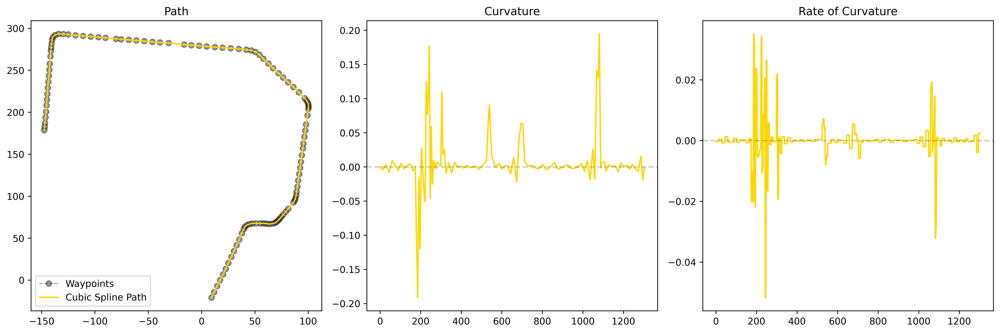

In [41]:
%matplotlib inline

dpk, _ = solve_1st_derivative(pk, pk)

fig, ax = plt.subplots(1, 3, figsize=(15, 5), dpi=600)

ax[0].set_box_aspect(1)
ax[0].set_title('Path')
ax[0].plot(wx, wy, '--ok', linewidth=1, alpha=0.4, label='Waypoints')
ax[0].plot(px, py, color='gold', label='Cubic Spline Path')
ax[0].legend()

ax[1].set_box_aspect(1)
ax[1].set_title('Curvature')
ax[1].plot(pk, color='gold')
ax[1].axhline(0, linestyle='--', color='k', alpha=0.2)

ax[2].set_box_aspect(1)
ax[2].set_title('Rate of Curvature')
ax[2].plot(dpk, color='gold')
ax[2].axhline(0, linestyle='--', color='k', alpha=0.2)

plt.tight_layout()
plt.show()

### Generating a Comparison Path
A path is with similar resolution to the optimised path is created for comparison.

In [42]:
cx, cy, _, ck = generate_cubic_path(wx, wy, 0.1)
dck, _ = solve_1st_derivative(ck, ck)

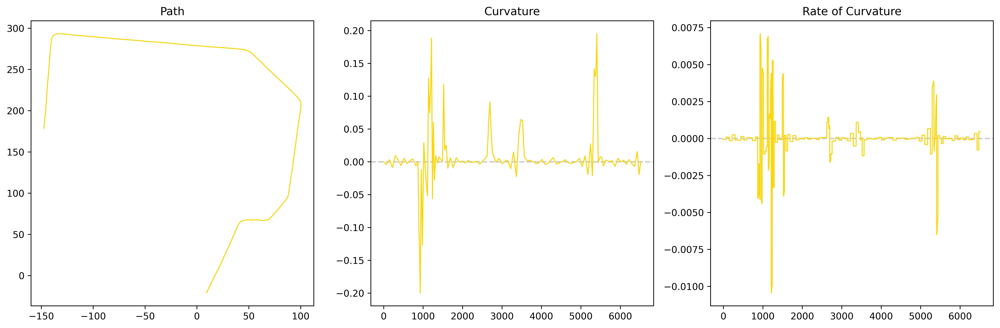

In [43]:
%matplotlib inline

fig, ax = plt.subplots(1, 3, figsize=(15, 5), dpi=600)

ax[0].set_title('Path')
ax[0].plot(cx, cy, color='gold', linewidth=1)

ax[1].set_title('Curvature')
ax[1].axhline(0, linestyle='--', color='k', alpha=0.2)
ax[1].plot(ck, color='gold', linewidth=1)

ax[2].set_title('Rate of Curvature')
ax[2].axhline(0, linestyle='--', color='k', alpha=0.2)
ax[2].plot(dck, color='gold', linewidth=1)

plt.tight_layout()
plt.show()

### Split Seeding Paths
To increase computation efficacy during optimisation, the path is split into smaller segments and solved separately.

In [44]:
splits = 50

px_split = [px[x:x + splits] for x in range(0, len(px), splits)]
py_split = [py[y:y + splits] for y in range(0, len(py), splits)]
pyaw_split = [pyaw[yaw:yaw + splits] for yaw in range(0, len(pyaw), splits)]

print("No. of splitted paths: {}".format(len(pyaw_split)))

No. of splitted paths: 27


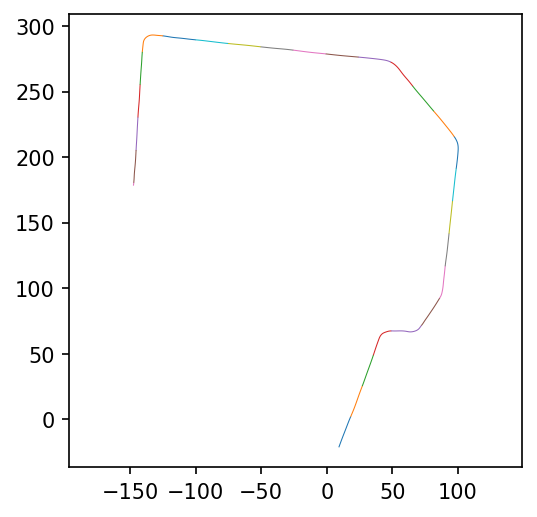

In [45]:
%matplotlib inline

plt.figure(dpi=150)
ax = plt.axes()
ax.set_aspect('equal')
ax.set_box_aspect(1)

for i in range(0, len(px_split)):
    ax.plot(px_split[i], py_split[i], linewidth=0.5)

plt.show()

### Define the boundary
For path planning, the boundary given are the bounds of optimisation. They can be represented as,
$$
o_i + o_i^{\text{seed}} \in [r_i, \ l_i],
$$
where $o_i$ is the lateral offset from the seeding path, $o_i^{\text{seed}}$ is the lateral offset from the centre of the road, and the value pairs of $l_i$ and $r_i$ are the left and right road boundaries, respectively. Of course, since the seeding path is the middle of the road, the value of $o_i^{\text{seed}}$ is zero and can be ignored in our equations. Thus, we can rewrite the equation as,
$$
o_i \in [r_i, \ l_i].
$$
Since the path is split into multiple segments, to preserve curvature continuity after stitching, the bounds for the first few and last few points are set to a value close to zero.

In [46]:
road_lx = []
road_ly = []
road_rx = []
road_ry = []
lx = []
ly = []
rx = []
ry = []
road_lx_split = []
road_ly_split = []
road_rx_split = []
road_ry_split = []
lx_split = []
ly_split = []
rx_split = []
ry_split = []
bound = []
bounds = []

road_offset = 3
max_lateral_offset = road_offset - 2.5


for n in range(0, len(pyaw_split)):
    for i in range(0, len(pyaw_split[n])):
        road_lx.append(px_split[n][i] - road_offset*np.sin(pyaw_split[n][i]))
        road_ly.append(py_split[n][i] + road_offset*np.cos(pyaw_split[n][i]))
        road_rx.append(px_split[n][i] + road_offset*np.sin(pyaw_split[n][i]))
        road_ry.append(py_split[n][i] - road_offset*np.cos(pyaw_split[n][i]))

    road_lx_split.append(road_lx)
    road_ly_split.append(road_ly)
    road_rx_split.append(road_rx)
    road_ry_split.append(road_ry)
    road_lx = []
    road_ly = []
    road_rx = []
    road_ry = []

    for i in range(0, len(pyaw_split[n])):
        lx.append(px_split[n][i] - max_lateral_offset*np.sin(pyaw_split[n][i]))
        ly.append(py_split[n][i] + max_lateral_offset*np.cos(pyaw_split[n][i]))
        rx.append(px_split[n][i] + max_lateral_offset*np.sin(pyaw_split[n][i]))
        ry.append(py_split[n][i] - max_lateral_offset*np.cos(pyaw_split[n][i]))

    lx_split.append(lx)
    ly_split.append(ly)
    rx_split.append(rx)
    ry_split.append(ry)
    lx = []
    ly = []
    rx = []
    ry = []

    preserved = 8
    for b in range(0, len(pyaw_split[n])):
        if b < preserved or b > len(pyaw_split[n]) - preserved:
            bound.append((-0.0001, 0.0001))

        else:
            bound.append((-max_lateral_offset, max_lateral_offset))

    bounds.append(tuple(bound))
    bound = []

print("Length of bounds: {}".format(len(bounds)))

Length of bounds: 27


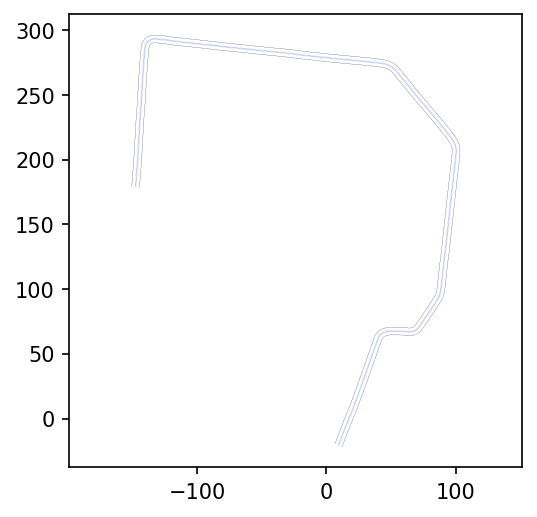

In [47]:
%matplotlib inline

plt.figure(dpi=150)
ax = plt.axes()
ax.set_aspect('equal')
ax.set_box_aspect(1)

px_unsplit = np.concatenate(px_split, axis=None)
py_unsplit = np.concatenate(py_split, axis=None)
road_lx_unsplit = np.concatenate(road_lx_split, axis=None)
road_ly_unsplit = np.concatenate(road_ly_split, axis=None)
road_rx_unsplit = np.concatenate(road_rx_split, axis=None)
road_ry_unsplit = np.concatenate(road_ry_split, axis=None)
lx_unsplit = np.concatenate(lx_split, axis=None)
ly_unsplit = np.concatenate(ly_split, axis=None)
rx_unsplit = np.concatenate(rx_split, axis=None)
ry_unsplit = np.concatenate(ry_split, axis=None)

ax.plot(px_unsplit, py_unsplit, linewidth=0.1)
ax.plot(road_lx_unsplit, road_ly_unsplit, '-k', linewidth=0.1)
ax.plot(road_rx_unsplit, road_ry_unsplit, '-k', linewidth=0.1)
ax.plot(lx_unsplit, ly_unsplit, '--b', alpha=0.5, linewidth=0.1)
ax.plot(rx_unsplit, ry_unsplit, '--b', alpha=0.5, linewidth=0.1)

plt.show()

### Define the Objective Function
The objective function remains as,
$$
\min(\sum^{N-1}_{i=0}{w_k \cdot |k_i^2|}).
$$

In [48]:
def objective_fcn_mod(lateral_offset, segment):

    wk = 5
    mox = px_split[segment].copy()
    moy = py_split[segment].copy()

    for n in range(0, len(pyaw_split[segment])):
        mox[n] -= lateral_offset[n]*np.sin(pyaw_split[segment][n])
        moy[n] += lateral_offset[n]*np.cos(pyaw_split[segment][n])

    mok = calculate_curvature_vector(mox, moy)

    curvature_cost = wk * np.mean(np.square(mok))

    return curvature_cost

### Define the Initial Values

In [49]:
guesses = []
for i in range(0, len(pyaw_split)):
    guesses.append(np.zeros(len(pyaw_split[i])))
    
print("Length of each guess: {}".format(len(guesses[0])))
print("Cost: {}".format(objective_fcn_mod(guesses[0], 0)))

Length of each guess: 50
Cost: 5.966238259126573e-05


### Define the Constraints
We can represent our constraint on curvature as the following inequality,
$$
||k_i|| \leq k_{\text{max}},
$$
where $k_{\text{max}}$ is the maximum curvature allowed. For compatibility with SciPy's `minimize()` function, the former equation must be rewritten as,
$$
k_{\text{max}} - ||k_i|| \geq 0
$$
Likewise, the constraint on rate of curvature can be written as,
$$
k'_{\text{max}} - ||k_i'|| \geq 0.
$$

In [50]:
kmax = 0.17
kmax_rate = 0.05

def max_curvature_rate_constraint(lateral_offset, segment):

    mox = px_split[segment].copy()
    moy = py_split[segment].copy()

    for n in range(0, len(pyaw_split[segment])):
        mox[n] -= lateral_offset[n]*np.sin(pyaw_split[segment][n])
        moy[n] += lateral_offset[n]*np.cos(pyaw_split[segment][n])

    mok = calculate_curvature_vector(mox, moy)
    dmok, _ = solve_1st_derivative(mok, mok)
    abs_dk = np.absolute(dmok)
    dk_i = np.max(abs_dk)

    return kmax_rate - dk_i

def max_curvature_constraint(lateral_offset, segment):

    mox = px_split[segment].copy()
    moy = py_split[segment].copy()

    for n in range(0, len(pyaw_split[segment])):
        mox[n] -= lateral_offset[n]*np.sin(pyaw_split[segment][n])
        moy[n] += lateral_offset[n]*np.cos(pyaw_split[segment][n])

    mok = calculate_curvature_vector(mox, moy)
    k_i = np.max(mok)

    return kmax - k_i

### Optimise
> WARNING: If speed is of importance, `visualise` should be set to `False`, as the animation will massively slow down optimisation performance.
>

In [51]:
visualise = False

print("REMINDER: Parallel optimisation is not possible. Optimising..\n")

start = t.time()

if visualise:
    %matplotlib inline
    
    from IPython.display import display, clear_output
    fig_cb = plt.figure(dpi=150)
    Nfeval = 0

    def callback(Xi):

        global Nfeval
        global arguments

        mox = px_split[iters].copy()
        moy = py_split[iters].copy()

        for n in range(0, len(pyaw_split[iters])):
            mox[n] -= Xi[n]*np.sin(pyaw_split[iters][n])
            moy[n] += Xi[n]*np.cos(pyaw_split[iters][n])

        mok = calculate_curvature(mox, moy)
        cum_mok = np.mean(np.absolute(mok))

        plt.clf()
        plt.figure(dpi=150)
        ax = plt.axes()
        ax.set_aspect('equal')
        ax.set_box_aspect(1)
        ax.axis('equal')
        ax.axes().set_box_aspect(1)

        ax.plot(lx_split[iters], ly_split[iters], '--b', alpha=0.5, linewidth=1)
        ax.plot(rx_split[iters], ry_split[iters], '--b', alpha=0.5, linewidth=1)
        ax.plot(road_lx_split[iters], road_ly_split[iters], '-k', linewidth=1)
        ax.plot(road_rx_split[iters], road_ry_split[iters], '-k', linewidth=1)
        ax.plot(px_split[iters], py_split[iters], '--', color='gold', linewidth=1)
        ax.plot(mox, moy, '-', color='magenta')

        ax.set_title("{} iterations".format(Nfeval), loc='right')
        ax.set_xlabel("Cumulative Curvature: {}".format(np.around(cum_mok, 4)))
        ax.set_ylabel("Segment: {}".format(arguments))

        # plt.savefig('fig/visualisation_{0:03}.png'.format(Nfeval), dpi=150)

        Nfeval += 1
        clear_output(wait=True)
        display(fig_cb)
        
    result = list(range(0, len(pyaw_split)))

    for iters in range(0, len(pyaw_split)):
        arguments = (iters,)

        max_curavture_rate = {'type': 'ineq', 'fun': max_curvature_rate_constraint, 'args': arguments}
        max_curvature = {'type': 'ineq', 'fun': max_curvature_constraint, 'args': arguments}
        constraints = [max_curvature, max_curavture_rate]

        result[iters] = minimize(objective_fcn_mod, guesses[iters], arguments, bounds=bounds[iters], constraints=constraints, options={'maxiter': 10000000}, callback=callback)

        if not result[iters].success:
            break
    
        else:
            pass

    print("Success: {}".format(result[iters].success))
    print("Message: {}".format(result[iters].message))

else:
    result = list(range(0, len(pyaw_split)))

    for iters in range(0, len(pyaw_split)):
        arguments = (iters,)

        max_curavture_rate = {'type': 'ineq', 'fun': max_curvature_rate_constraint, 'args': arguments}
        max_curvature = {'type': 'ineq', 'fun': max_curvature_constraint, 'args': arguments}
        constraints = [max_curvature, max_curavture_rate]

        %time result[iters] = minimize(objective_fcn_mod, guesses[iters], arguments, bounds=bounds[iters], constraints=constraints, options={'maxiter': 10000000})

        print("Success: {}".format(result[iters].success))
        print("Message: {}".format(result[iters].message))
        print("Evaluations: {}".format(result[iters].nfev))
        print("Iterations: {}".format(result[iters].nit))
        print("Segment: {}\n".format(iters))

        if not result[iters].success:
            break
    
        else:
            pass

    if not result[iters].success:
        pass

    else:
        print("All segments have been successfully optimised.")

end = t.time()
modified_time = end - start

print("Completed in {} seconds.".format(np.around(modified_time, 4)))

REMINDER: Parallel optimisation is not possible. Optimising..

CPU times: user 104 ms, sys: 62 µs, total: 104 ms
Wall time: 96.8 ms
Success: True
Message: Optimization terminated successfully
Evaluations: 53
Iterations: 1
Segment: 0

CPU times: user 107 ms, sys: 154 µs, total: 107 ms
Wall time: 96 ms
Success: True
Message: Optimization terminated successfully
Evaluations: 53
Iterations: 1
Segment: 1

CPU times: user 98.5 ms, sys: 4.23 ms, total: 103 ms
Wall time: 91.9 ms
Success: True
Message: Optimization terminated successfully
Evaluations: 52
Iterations: 1
Segment: 2

/home/winston/miniconda3/lib/python3.8/site-packages/scipy/optimize/optimize.py:282: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
CPU times: user 4.16 s, sys: 7.79 ms, total: 4.17 s
Wall time: 4.1 s
Success: True
Message: Optimization terminated successfully
Evaluations: 2378
Iterations: 46
Segment: 3

CPU times: u

### Stitching

In [52]:
if result[iters].success:
    mox = px_unsplit.copy()
    moy = py_unsplit.copy()
    results = []

    for segments in range(0, iters + 1):
            results.append(result[segments].x)

    combined_results = np.concatenate(results, axis=None)

    for n in range(0, len(combined_results)):
        mox[n] -= combined_results[n]*np.sin(pyaw[n])
        moy[n] += combined_results[n]*np.cos(pyaw[n])

else:
    raise Exception("Optimisation failed.")

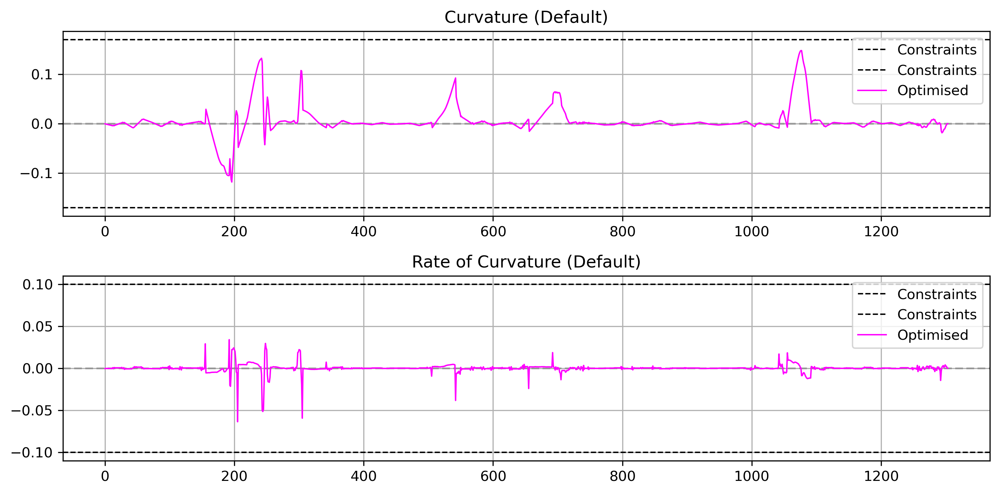

In [53]:
%matplotlib inline

mok = calculate_curvature(mox, moy)
dmok, _ = solve_1st_derivative(mok, mok)

fig, ax = plt.subplots(2, 1, figsize=(10, 5), dpi=300)

ax[0].set_title('Curvature (Default)')
ax[0].axhline(0, linestyle='--', color='k', alpha=0.2)
ax[0].axhline(kmax, linestyle='--', color='k', linewidth=1, label='Constraints')
ax[0].axhline(-kmax, linestyle='--', color='k', linewidth=1, label='Constraints')
ax[0].plot(mok, color='magenta', linewidth=1, label='Optimised')
ax[0].legend()
ax[0].grid()

ax[1].set_title('Rate of Curvature (Default)')
ax[1].axhline(0, linestyle='--', color='k', alpha=0.2)
ax[1].axhline(kmax_rate, linestyle='--', color='k', linewidth=1, label='Constraints')
ax[1].axhline(-kmax_rate, linestyle='--', color='k', linewidth=1, label='Constraints')
ax[1].plot(dmok, color='magenta', linewidth=1, label='Optimised')
ax[1].legend()
ax[1].grid()

plt.tight_layout()
plt.show()

In [54]:
from scipy.spatial.distance import euclidean

new_wx = []
new_wy = []

for waypoints in range(0, len(wx)):
    dists = []
    
    for subpoint in range(0, len(mox)):
        dist = euclidean([wx[waypoints], wy[waypoints]], [mox[subpoint], moy[subpoint]])
        dists.append(dist)

    shortest_index = np.argmin(dists)
    new_wx.append(mox[shortest_index])
    new_wy.append(moy[shortest_index])

### Supersampling

In [55]:
ox, oy, _, ok = generate_cubic_path(new_wx, new_wy, 0.1)
# ox, oy, _, ok = generate_cubic_path(mox, moy, 0.1)
dok, _ = solve_1st_derivative(ok, ok)

cum_ok = np.mean(np.absolute(ok))
cum_pk = np.mean(np.absolute(ck))

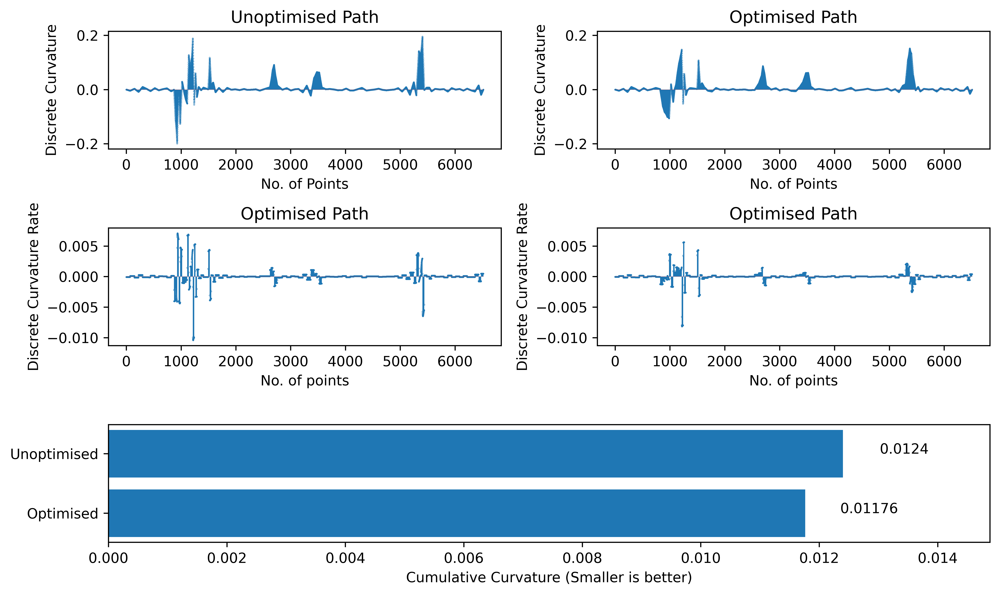

In [56]:
%matplotlib inline

category = ['Optimised', 'Unoptimised']
curvature = [cum_ok, cum_pk]

gs = gridspec.GridSpec(3, 2)
fig = plt.figure(dpi=600, figsize=(10, 6))

ax1 = fig.add_subplot(gs[2, :]) 
ax1.barh(category, curvature)
ax1.set_xlabel('Cumulative Curvature (Smaller is better)')
ax1.set_xlim((0, max(curvature) + (0.2*max(curvature))))

for index, value in enumerate(curvature):
    ax1.text(value + (0.05*value), index, str(np.around(value, 5)))

ax2 = fig.add_subplot(gs[0, 0])
marker1, stem1, base1, = ax2.stem(range(0, len(ck)), ck)
ax2.set_ylabel('Discrete Curvature')
ax2.set_xlabel('No. of Points')
ax2.set_title('Unoptimised Path')

ax3 = fig.add_subplot(gs[0, 1], sharey=ax2)
marker2, stem2, base2, = ax3.stem(range(0, len(ok)), ok)
ax3.set_ylabel('Discrete Curvature')
ax3.set_xlabel('No. of Points')
ax3.set_title('Optimised Path')

ax4 = fig.add_subplot(gs[1, 0])
marker3, stem3, base3, = ax4.stem(range(0, len(dck)), dck)
ax4.set_ylabel('Discrete Curvature Rate')
ax4.set_xlabel('No. of points')
ax4.set_title('Optimised Path')

ax5 = fig.add_subplot(gs[1, 1], sharey=ax4)
marker4, stem4, base4, = ax5.stem(range(0, len(dok)), dok)
ax5.set_ylabel('Discrete Curvature Rate')
ax5.set_xlabel('No. of points')
ax5.set_title('Optimised Path')

plt.setp(stem1, 'linewidth', 0.1)
plt.setp(marker1, 'markersize', 0.2)
plt.setp(base1, 'linewidth', 0.1)
plt.setp(stem2, 'linewidth', 0.1)
plt.setp(marker2, 'markersize', 0.2)
plt.setp(base2, 'linewidth', 0.1)
plt.setp(stem3, 'linewidth', 0.1)
plt.setp(marker3, 'markersize', 0.2)
plt.setp(base3, 'linewidth', 0.1)
plt.setp(stem4, 'linewidth', 0.1)
plt.setp(marker4, 'markersize', 0.2)
plt.setp(base4, 'linewidth', 0.1)

plt.tight_layout()
plt.show()

In [68]:
%matplotlib qt

plt.figure()
ax = plt.axes()
ax.set_aspect('equal')

ax.plot(wx, wy, 'ok', alpha=0.4, label='Waypoints')
ax.plot(cx, cy, color='gold', label='Default')
ax.plot(ox, oy, color='magenta', label='Optimised')
ax.plot(road_lx_unsplit, road_ly_unsplit, '-k', alpha=0.2)
ax.plot(road_rx_unsplit, road_ry_unsplit, '-k', alpha=0.2)
ax.plot(lx_unsplit, ly_unsplit, '--b', alpha=0.5, label='Lateral Constraint')
ax.plot(rx_unsplit, ry_unsplit, '--b', alpha=0.5, label='Lateral Constraint')
ax.legend()

plt.show()

In [1]:
%matplotlib inline

fig, ax = plt.subplots(2, 1, figsize=(10, 5), dpi=300)

ax[0].set_title('Curvature (Supersampled)')
ax[0].axhline(0, linestyle='--', color='k', alpha=0.2)
ax[0].axhline(kmax, linestyle='--', color='k', linewidth=1, label='Constraints')
ax[0].axhline(-kmax, linestyle='--', color='k', linewidth=1, label='Constraints')
ax[0].plot(ok, color='magenta', linewidth=1)
ax[0].legend()
ax[0].grid()

ax[1].set_title('Rate of Curvature (Supersampled)')
ax[1].axhline(0, linestyle='--', color='k', alpha=0.2)
ax[1].axhline(kmax_rate, linestyle='--', color='k', linewidth=1, label='Constraints')
ax[1].axhline(-kmax_rate, linestyle='--', color='k', linewidth=1, label='Constraints')
ax[1].plot(dok, color='magenta', linewidth=1)
ax[1].legend()
ax[1].grid()

plt.tight_layout()
plt.show()

NameError: name 'plt' is not defined

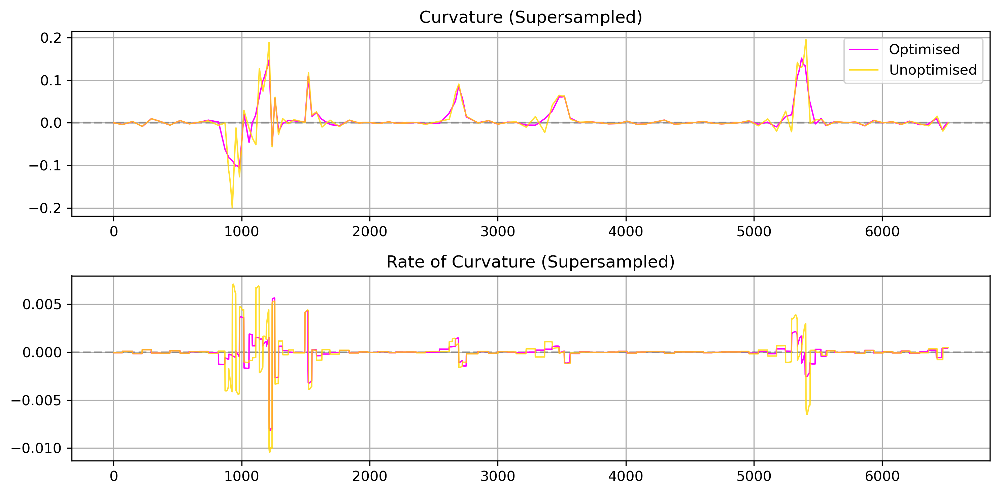

In [59]:
%matplotlib inline

fig, ax = plt.subplots(2, 1, figsize=(10, 5), dpi=300)

ax[0].set_title('Curvature (Supersampled)')
ax[0].axhline(0, linestyle='--', color='k', alpha=0.2)
ax[0].plot(ok, color='magenta', linewidth=1, label='Optimised')
ax[0].plot(ck, color='gold', linewidth=1, alpha=0.8, label='Default')
ax[0].legend()
ax[0].grid()

ax[1].set_title('Rate of Curvature (Supersampled)')
ax[1].axhline(0, linestyle='--', color='k', alpha=0.2)
ax[1].plot(dok, color='magenta', linewidth=1, label='Optimised')
ax[1].plot(dck, color='gold', linewidth=1, alpha=0.8, label='Default')
ax[1].grid()

plt.tight_layout()
plt.show()

### Remarks